# "My Title"
> "Awesome summary"

- toc:true- branch: master
- badges: true
- comments: true
- author: Hamel Husain & Jeremy Howard
- categories: [fastpages, jupyter]

In [1]:
import pandas as pd
import numpy as np

import torch 
from torch import tensor
import matplotlib.pyplot as plt
import random
import os

import imageio
from IPython.display import Image

class GeradorGIF():
    """Gera um GIF a partir de uma sequência de gráficos"""
    
    fig_number = 0
    tempfiles = []
    filename = ""
    path = ""
    frame_duration=None
    
    def __init__(self, path, filename, frame_duration=None):
        """path - o diretório onde o GIF será salvo.
        filename - o nome do arquivo GIF a ser salvo."""
        
        self.fig_number = 0
        self.tempfiles = []
        self.path = path
        self.filename = filename
        self.frame_duration=frame_duration

    def add(self, fig):
        """Esse método deve ser chamado para cada gráfico do matplotlib que se queira adicionar ao GIF.
        
        fig - Um objeto matplotlib.pyplot.figure, que será colocado como um quadro do GIF"""
        
        self.fig_number += 1
        filename = self.path+"/tmp_"+str(self.fig_number)+"_"+self.filename+".png"
        plt.savefig(filename)
        self.tempfiles.append(filename)
        
    def finish(self):
        """Esse método deve ser chamado quando todas os gráficos necessários já tiverem sido adicionados. 
        Ele irá gerar o arquivo GIF final."""
        if self.frame_duration is None:
            with imageio.get_writer(self.path+"/"+self.filename+".gif", mode='I') as writer:
                for filename in self.tempfiles:
                    image = imageio.imread(filename)
                    writer.append_data(image, meta={"fps":1})  
        else:
            frames = []
            for filename in self.tempfiles:
                frames.append(imageio.imread(filename))
            kargs = { 'duration': self.frame_duration }
            imageio.mimsave(self.path+"/"+self.filename+".gif", frames, 'GIF', **kargs)
            del frames

        for filename in set(self.tempfiles):
            os.remove(filename) 
                
    def show(self, size=None):    
        """Mostra o arquivo GIF gerado."""
        if size is None:
            im = Image(filename=f'{self.path}/{self.filename}.gif')
        else:
            im = Image(filename=f'{self.path}/{self.filename}.gif', width=size[0],height=size[1]) 
        return im

O aprendizado de máquina (machine learning) é fundamentalmente baseado na capacidade em que as máquinas têm de encontrar padrões nos dados durante uma etapa de treinamento. Nesse treinamento, os algoritmos de aprendizado de máquina refinam o seu entendimento sobre os padrões inerentes aos dados, ou seja, eles aprendem com a experiência, obtendo cada vez melhores resultados em suas predições. 

Mas como é que esses algoritmos conseguem aprender ao longo do tempo?

O coração desse aprendizado é o Gradiente Descendente, que é uma técnica de otimização que permite encontrar parâmetros cada vez melhores para um modelo de modo que ao final do processo esse modelo consiga uma boa aproximação com relação aos dados oferecidos.

Nesse artigo eu vou tentar explicar o conceito do Gradiente Descendente de uma maneira intuitiva e com o mínimo de matemática possível. Faço isso porque acredito que, em um primeiro momento, o mais importante seja a formação de um entendimento de alto nível sobre o assunto e os mecanismos que servem de base à técnica. A matemática é um segundo passo para aqueles que quiserem aprofundar, mas é totalmente opcional para aqueles interessados apenas em realizar treinamento de modelos de machine learning. 

# Estimando o erro de uma solução (**Loss**)

Imagine que você tenha um problema a ser resolvido, mas não sabe ainda exatamente qual é a solução. Imagine também que tudo o que você sabe no momento é o quanto você está errado sobre alguma tentativa de solução que puder criar. Se você tiver uma forma de medir esse erro numericamente, pode ir realizando diversas tentativas de solução até encontrar alguma que esteja menos errada que todas as outras, não é? Por hora vamos chamar essa forma de calcular o quanto uma solução está errada de **Loss**.

Mas se eu não sei qual a solução correta, como eu posso saber o quanto as minhas propostas de solução estão erradas?

Em machine learning, o seu problema normalmente é encontrar alguma forma de saber um resultado **y** a partir de um conjunto de dados de entrada **X**. Por exemplo, podemos estar interessados em encontrar o preço de venda de um imóvel a partir de algumas informações que dispomos sobre ele como localização, tamanho e número de quartos.

A representação do meu problema poderia ser escrita assim:

**f(localizacao, tamanho, numero_quartos) = preco_venda**

ou

**f(X) = y**     para      **X = localizacao, tamanho, numero_quartos**     e     **y = preco_venda**

E na verdade, o seu problema de machine learning é encontrar essa função **f** capaz transformar as entradas em um resultado correto.

Normalmente também estão disponíveis um grande número de dados de treinamento:

In [2]:
treinamento = pd.DataFrame({"localizacao":["centro","zona norte","praias"], "tamanho":[50,65,30], "numero_quartos":[2,3,1], "preco":[300,400,120]})
treinamento

,localizacao,tamanho,numero_quartos,preco
0,centro,50,2,300
1,zona norte,65,3,400
2,praias,30,1,120


Dessa forma, supondo que os dados de treinamento estão corretos, temos que:

**f(centro, 50, 2) = 300**

**f(zona norte, 65, 3) = 400**

**f(praias, 30, 1) = 120**

Ok, então nessa situação, mesmo sem saber qual é a solução para o meu problema (a função **f**), eu posso saber o quanto uma solução proposta está errada (**Loss**) comparando o quanto os resultados dessa minha solução são diferentes daqueles encontrados no meu cojundo de dados de treinamento. Vamos tentar dessa forma.

A minha primeira tentativa de solução será **f1** e vamos supor que ela dê os seguintes resultados para os dados de treinamento:

**f1(centro, 50, 2) = 5000**

**f1(zona norte, 65, 3) = 20**

**f1(praias, 30, 1) = 5**

É, parece que os resultados não foram muito bons. Mas o quanto será que eles estão errados? É aí que entra a função **Loss**. Com ela podemos definir numericamente o valor desse erro. 

Existem diversas formas de definir a função **Loss**, mas uma forma muito comum é utilizar o Erro Absoluto Médio, que é a média da distância entre os valores dos dados de treinamento e da previsão. Vamos definir a nossa função **Loss** e calcular o erro para **f1**.

In [3]:
def loss(previsao, treinamento):
    return (previsao-treinamento).abs().mean()

f1 = tensor([5000.0, 20.0, 5.0])
f = tensor(treinamento.preco)

erro = loss(f1, f)
print(f"Erro: {erro:.3f}") 

Erro: 1731.667


Mas normalmente não é necessário definir a sua própria função Loss, porque as bibliotecas de aprendizado de máquina já disponibilizam diversas possibilidades. Abaixo podemos ver como chegar ao mesmo valor com a sklearn.

In [4]:
from sklearn.metrics import mean_absolute_error

erro = mean_absolute_error(f1, f)
print(f"Erro: {erro:.3f}") 

Erro: 1731.667


Então agora que eu já consigo medir o quanto a minha proposta de solução está errada, vamos a uma segunda tentativa. Vamos supor que a minha segunda tentativa de solução **f2** dê os seguintes resultados para os dados de treinamento:

**f2(centro, 50, 2) = 4500**

**f2(zona norte, 65, 3) = 50**

**f2(praias, 30, 1) = 10**

Nesse caso podemos calcular o erro e ver se o resultado foi melhor ou não:

In [5]:
f2 = np.array([4500, 50, 10])

erro = mean_absolute_error(f2, f)
print(f"Erro: {erro:.3f}") 

Erro: 1553.333


Bem, realmente o erro de **f2** foi menor do que o erro de **f1**, mas o que foi feito na segunda tentativa para que isso acontecesse? É o que vamos explicar a seguir.

# Gradiente Descendente - Conceito

Perceba que para cada solução candidata eu tenho um valor de erro diferente, de modo que seria possível traçar um gráfico dos valores de erro em função das soluções candidatas. Imagine que fizéssemos isso para o exemplo do preço dos imóveis e chegássemos ao gráfico abaixo. 

Nele é possível perceber que existe uma determinada solução que tem um erro menor do que todas as outras (o ponto mais baixo da curva). Essa seria a solução ótima para o problema. 

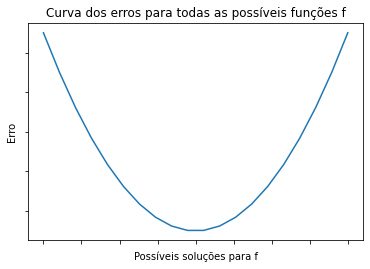

In [6]:
def f_erro(x):
    #ignore essa equação. ela não tem nenhum significado em especial. é só para gerar um gráfico ilustrativo.
    return 0.5*x**2-10*x+55 

x = np.linspace(0,20,20)
y = f_erro(x)

ax =  plt.subplots()[1]
ax.set_title('Curva dos erros para todas as possíveis funções f')
plt.xlabel("Possíveis soluções para f")
plt.ylabel("Erro")
ax.set_xticklabels([])
ax.set_yticklabels([])
plot = plt.plot(x,y)


O problema é que para traçar esse gráfico eu teria que calcular o erro para cada possível solução candidata. Na prática isso é impraticável em problemas reais já que o espaço de possívieis soluções pode ser imenso.

Então o que pode ser feito na prática?

O nosso problema é de encontar a função com menor erro, ou em outras palavras, o ponto mínimo de uma curva de erro. A dificuldade é que não conhecemos a curva de erro, já que é impraticável calcular todos os pontos dela. 

Essa situação é semelhante a alguém que está em algum ponto de uma montanha e quer chegar ao ponto mais baixo do vale. Só que essa pessoa está com os olhos vendados e não conhece o caminho para a parte de baixo. 

Ainda no exemplo da montanha, essa pessoa poderia chegar à parte de baixo usando uma estratégia simples. Daria um passo em uma direção qualquer e depois perceberia se isso fez ela subir ou descer. Caso ela tenha descido, dará um passo na mesma direção e perceberá novamente se continua descendo. Por outro lado, caso ela dê um passo e perceba que acabou subindo, voltará para onde estava antes e tentará dar um passo em outra direção. Depois de diversos passo, idas e voltas, ela terá chegado à parte de baixo. 

Trazendo esse conceito para o caso de otimização do erro da função, uma alternativa é começar com uma solução qualquer, como fizemos acima. Seria a nossa **f1** e calcular o erro dela. Note que agora não temos mais a opção de ter um gráfico mapeando todas as possíveis soluções candidatas em nosso problema de otimização, mas ele será mantido com linha pontilhada para sinalizar que é apenas para fins didático. Durante o aprendizado de máquina, tudo o que ela terá acesso são os pontos vermelhos.

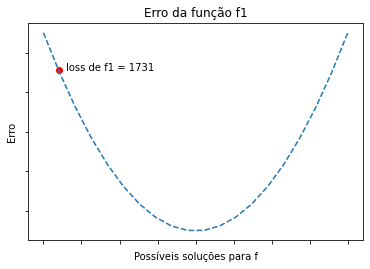

In [7]:
p1_x = 1
p1_y = f_erro(p1_x)

ax =  plt.subplots()[1]
ax.set_title('Erro da função f1')
plt.xlabel("Possíveis soluções para f")
plt.ylabel("Erro")
plt.plot(x,y, linestyle='dashed')
plt.scatter(p1_x, p1_y, color="red")
plt.text(p1_x+0.5, p1_y, "loss de f1 = 1731")
ax.set_xticklabels([])
rejeito = ax.set_yticklabels([])

Depois, mudamos um pouco os parâmetros da tentativa chegando a **f2** e verificamos se o resultado foi melhor ou não. 

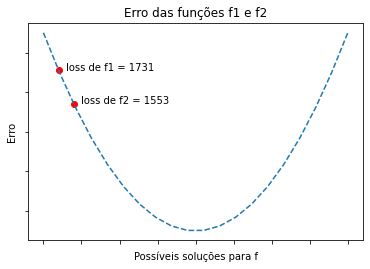

In [8]:
p1_x = 1
p1_y = f_erro(p1_x)
p2_x = 2
p2_y = f_erro(p2_x)


ax =  plt.subplots()[1]
ax.set_title('Erro das funções f1 e f2')
plt.xlabel("Possíveis soluções para f")
plt.ylabel("Erro")
plt.plot(x,y, linestyle='dashed')
plt.scatter(p1_x, p1_y, color="red")
plt.text(p1_x+0.5, p1_y, "loss de f1 = 1731")
plt.scatter(p2_x, p2_y, color="red")
plt.text(p2_x+0.5, p2_y, "loss de f2 = 1553")
ax.set_xticklabels([])
rejeito = ax.set_yticklabels([])

Ótimo! Estamos na direção certa. Então qualquer que tenha sido a alteração de parâmetros de **f1** para **f2**, se eu tentar a mesma coisa novamente, é bem possível que consiga resultados ainda melhores. Se, por outro lado, em um passo desses a mudança resultar em um erro maior, eu posso tentar uma mudança de parâmetros em outra direção ou posso também tentar uma mudança de parâmetros menor. 

Esse método descrito, apesar de funcionar, não é muito eficiente. As mudanças de parâmetro acontecem sem um critério definido e diversos desses passos intermediários (tentativas de otimização) são infrutíferos.

Voltando ao exemplo da montanha, existe uma estratégia melhor de descer do que a que foi apresentada. A pessoa pode fazer a descida apenas sentindo o solo abaixo de seus pés. Sempre que ela nota que a encosta está inclinada em determinada direção, ela dá um pequeno passo nessa direção e repete o processo. Idealmente, depois de vários passos ela terá chegado ao ponto mais baixo da montanha. 

Trazendo essa ideia para a questão da redução do erro, chegamos ao que chamados de Gradiente Descendente. A forma matemática de saber a inclinação de uma função é calcular a sua derivada. E a forma matemática de dar um passo é fazer um pequeno incremento na direção da derivada.

Se você não sabe calcular a derivada, não precisa se preocupar com isso. Esse é um cálculo feito de maneira trasparente pelas bibliotecas de aprendizado de máquina. Na maioria das vezes só precisamos utilizar essas ferramentas como uma caixa preta. Entretanto, pelo menos o conceito de derivada é importante para entender a descida de gradiente.

Como podemos ver na figura a seguir, a derivada é a inclinação da reta que tangencia a curva em determinado ponto. Significa que naquele ponto específico da curva, ela tem exatamente a mesma inclinação da reta encontrada. Além disso, quanto maior o valor numérico da derivada, mais inclinada é a reta. 

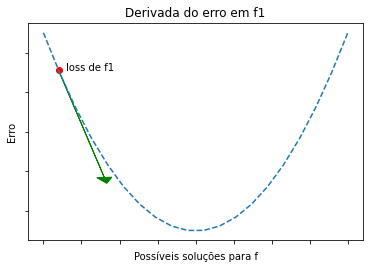

In [9]:
p1_x = tensor(1.0).requires_grad_()
p1_y = f_erro(p1_x)
p1_y.backward()
tamanho_seta = 3
der_x = tamanho_seta
der_y = p1_x.grad*tamanho_seta

ax =  plt.subplots()[1]
ax.set_title('Derivada do erro em f1')
ax.arrow(p1_x, p1_y, der_x, der_y, head_width=1, color="green")
plt.xlabel("Possíveis soluções para f")
plt.ylabel("Erro")
plt.plot(x,y, linestyle='dashed')
plt.scatter(p1_x.data, p1_y.data, color="red")
plt.text(p1_x+0.5, p1_y, "loss de f1")
ax.set_xticklabels([])
rejeito = ax.set_yticklabels([])

Ok, agora que já sei qual a inclinação da curva de erro para **f1**, eu posso escolher com mais facilitada em que direção eu vou dar um passo para encontrar **f2**. Depois de encontrar **f2** é só repetir o processo quantas vezes forem necessárias até que não seja mais possível encontrar outro ponto de erro menor que o atual. 

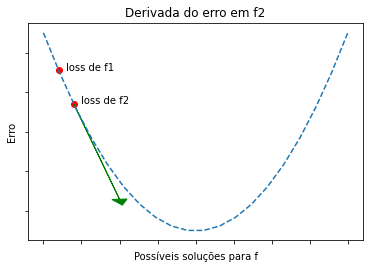

In [10]:
p1_x = tensor(1.0).requires_grad_()
p1_y = f_erro(p1_x)
p2_x = tensor(2.0).requires_grad_()
p2_y = f_erro(p2_x)
p2_y.backward()
tamanho_seta = 3
der_x = tamanho_seta
der_y = p2_x.grad*tamanho_seta

ax =  plt.subplots()[1]
ax.set_title('Derivada do erro em f2')
ax.arrow(p2_x, p2_y, der_x, der_y, head_width=1, color="green")
plt.xlabel("Possíveis soluções para f")
plt.ylabel("Erro")
plt.plot(x,y, linestyle='dashed')
plt.scatter(p1_x.data, p1_y.data, color="red")
plt.scatter(p2_x.data, p2_y.data, color="red")
plt.text(p1_x+0.5, p1_y, "loss de f1")
plt.text(p2_x+0.5, p2_y, "loss de f2")
ax.set_xticklabels([])
rejeito = ax.set_yticklabels([])

# Taxa de aprendizagem (Learning Rate)

Mas qual o tamanho do passo para encontar uma nova tentativa? Isso tem alguma importância?

No exemplo abaixo podemos ver que um passo muito grande pode levar a erros cada vez maiores, já que o movimento está na direção correta, mas passa (e muito) o ponto mínimo da curva.

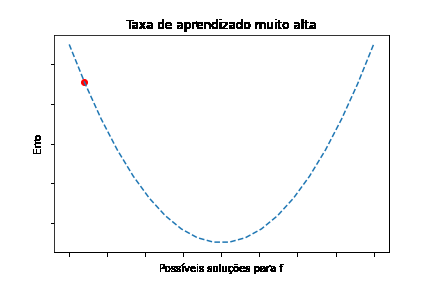

In [11]:
p1_x = tensor(1.0).requires_grad_()
learning_rate = 2.015

geradorGIF = GeradorGIF("./","lr_muito_grande",0.5)

for i in range(8):
    p1_y = f_erro(p1_x)
    ax =  plt.subplots()[1]
    ax.set_title('Taxa de aprendizado muito alta')
    plt.xlabel("Possíveis soluções para f")
    plt.ylabel("Erro")
    plt.plot(x,y, linestyle='dashed')
    plt.scatter(p1_x.data, p1_y.data, color="red")
    ax.set_xticklabels([])
    rejeito = ax.set_yticklabels([])
    p1_y.backward()
    p1_x.data -= p1_x.grad.data*learning_rate
    p1_x.grad = None
    geradorGIF.add(ax)
    plt.close()

geradorGIF.finish()
geradorGIF.show((500,500))

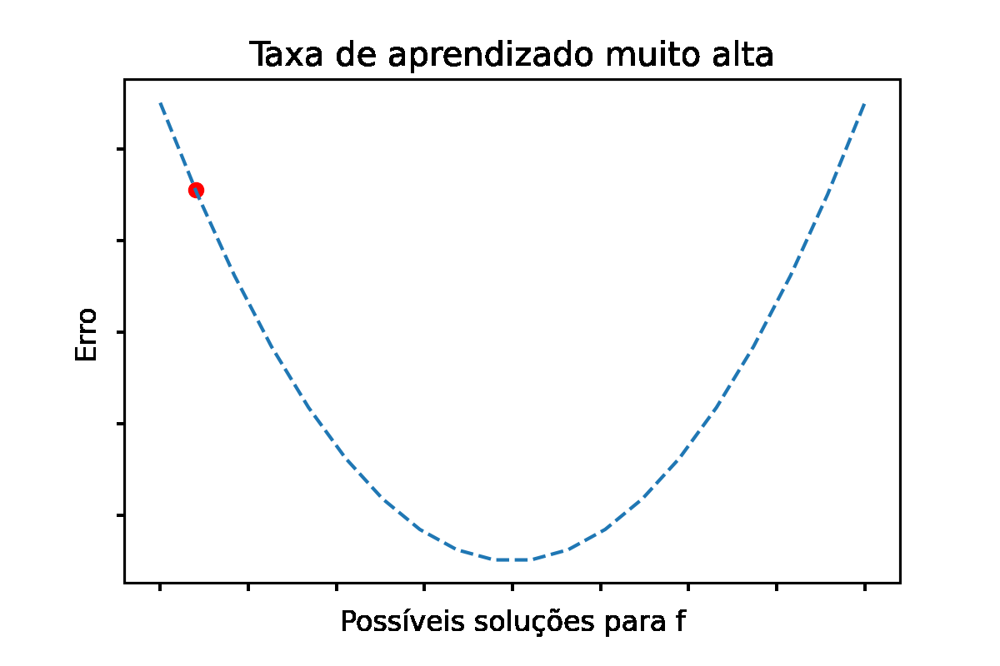

In [12]:
Image(filename="../input/recursos-para-artigo-de-gradiente-descendente/lr_muito_grande.gif", width= 500, height=500)

Já o exemplo abaixo é o caso contrário. Temos um passo muito pequeno. Nesse caso o modelo demora muito tempo para chegar a uma solução. 

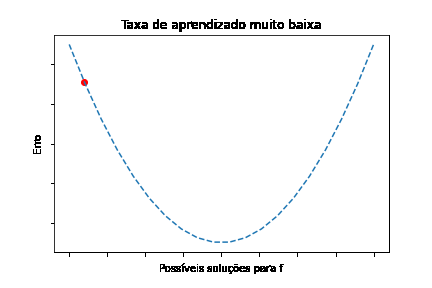

In [13]:
p1_x = tensor(1.0).requires_grad_()
learning_rate = 0.01

geradorGIF = GeradorGIF("./","lr_muito_pequena",0.5)

for i in range(20):
    p1_y = f_erro(p1_x)
    ax =  plt.subplots()[1]
    ax.set_title('Taxa de aprendizado muito baixa')
    plt.xlabel("Possíveis soluções para f")
    plt.ylabel("Erro")
    plt.plot(x,y, linestyle='dashed')
    plt.scatter(p1_x.data, p1_y.data, color="red")
    ax.set_xticklabels([])
    rejeito = ax.set_yticklabels([])
    p1_y.backward()
    p1_x.data -= p1_x.grad.data*learning_rate
    p1_x.grad = None
    geradorGIF.add(ax)
    plt.close()

geradorGIF.finish()
geradorGIF.show((500,500))

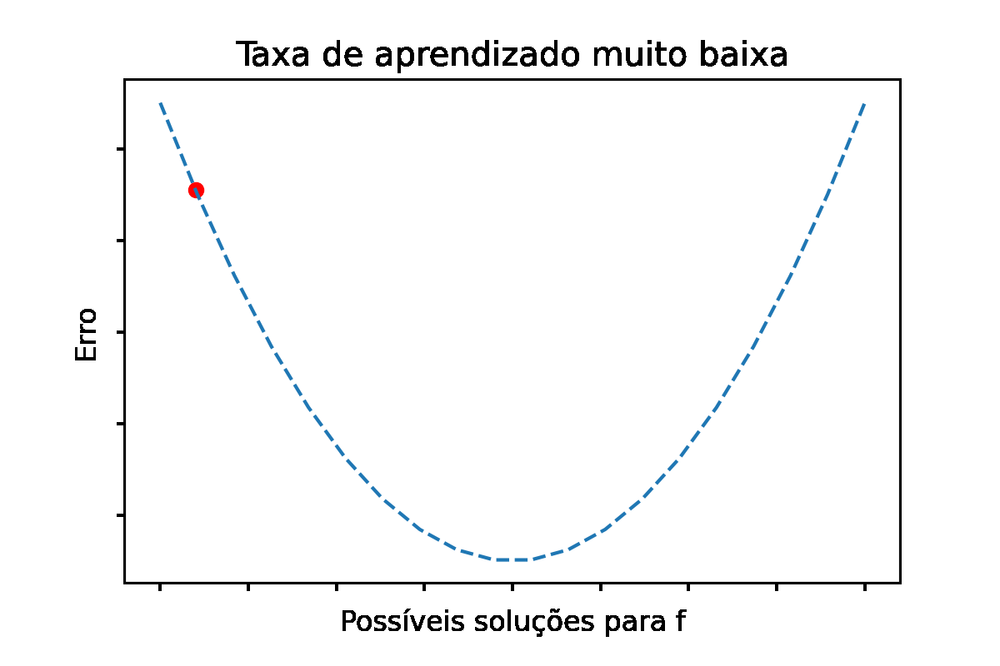

In [14]:
Image(filename="../input/recursos-para-artigo-de-gradiente-descendente/lr_muito_pequena.gif", width= 500, height=500)

A próxima situação também mostra um passo grande, um pouco menor que o primeiro exemplo. O modelo não converge para uma solução ou demora muito tempo para isso.

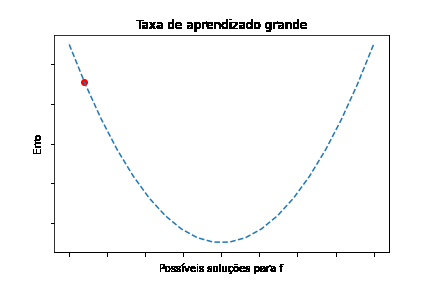

In [15]:
p1_x = tensor(1.0).requires_grad_()
learning_rate = 1.95

geradorGIF = GeradorGIF("./","lr_grande",0.5)

for i in range(20):
    p1_y = f_erro(p1_x)
    ax =  plt.subplots()[1]
    ax.set_title('Taxa de aprendizado grande')
    plt.xlabel("Possíveis soluções para f")
    plt.ylabel("Erro")
    plt.plot(x,y, linestyle='dashed')
    plt.scatter(p1_x.data, p1_y.data, color="red")
    ax.set_xticklabels([])
    rejeito = ax.set_yticklabels([])
    p1_y.backward()
    p1_x.data -= p1_x.grad.data*learning_rate
    p1_x.grad = None
    geradorGIF.add(ax)
    plt.close()

geradorGIF.finish()
geradorGIF.show((500,500))

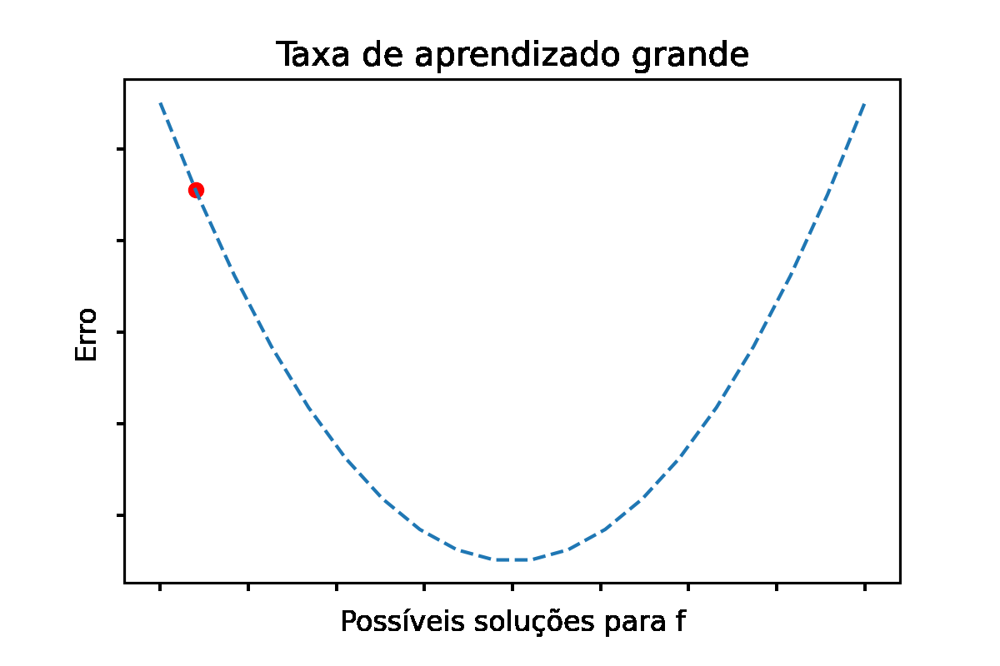

In [16]:
Image(filename="../input/recursos-para-artigo-de-gradiente-descendente/lr_grande.gif", width= 500, height=500)

Já se o tamanho do passo for o ideal, o modelo converge para uma solução em um tempo razoável.

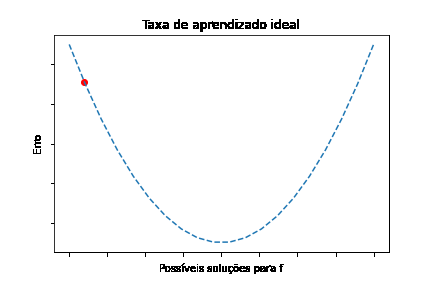

In [17]:
p1_x = tensor(1.0).requires_grad_()
learning_rate = 0.4

geradorGIF = GeradorGIF("./","lr_ideal",0.5)

for i in range(20):
    p1_y = f_erro(p1_x)
    ax =  plt.subplots()[1]
    ax.set_title('Taxa de aprendizado ideal')
    plt.xlabel("Possíveis soluções para f")
    plt.ylabel("Erro")
    plt.plot(x,y, linestyle='dashed')
    plt.scatter(p1_x.data, p1_y.data, color="red")
    ax.set_xticklabels([])
    rejeito = ax.set_yticklabels([])
    p1_y.backward()
    p1_x.data -= p1_x.grad.data*learning_rate
    p1_x.grad = None
    geradorGIF.add(ax)
    plt.close()

geradorGIF.finish()
geradorGIF.show((500,500))

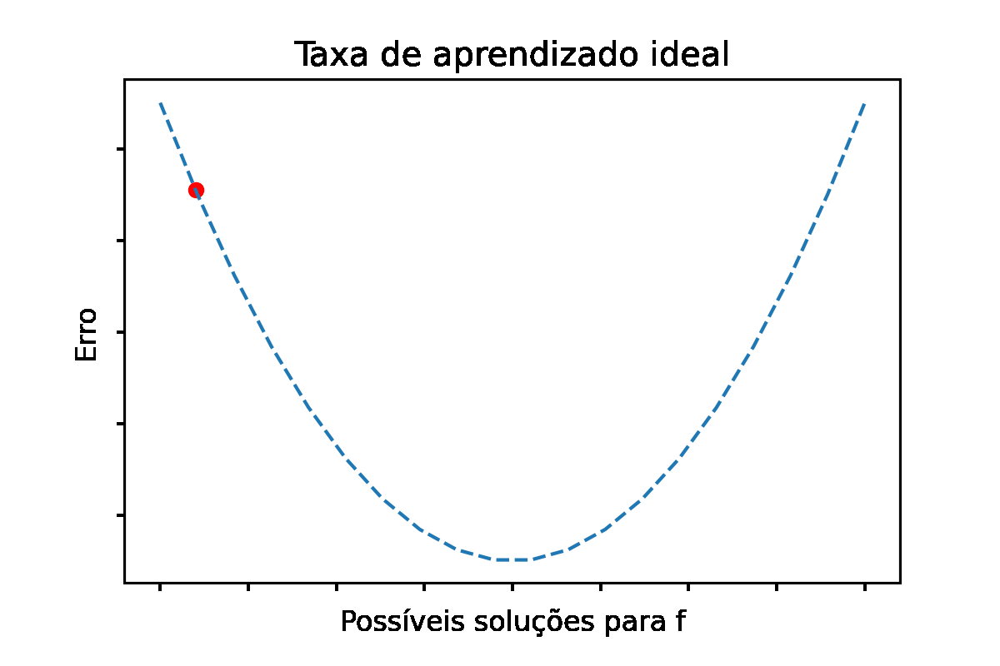

In [18]:
Image(filename="../input/recursos-para-artigo-de-gradiente-descendente/lr_ideal.gif", width= 500, height=500)

# Implementando o Gradiente Descendente

Para essa segunda parte da explicação, vamos tomar um exemplo diferente. Vamos supor que estou estudando a taxa de incidência de doenças em uma população de ratos e a relação dessa taxa com a alimentação dos mesmos. 

Nesse caso, após algumas medições eu chego no seguinte conjunto de dados de treinamento:

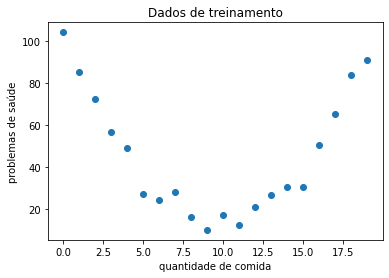

In [19]:
#definindo a semente aleatória para os resultados ficarem consistentes
torch.manual_seed(0)
random.seed(0)
np.random.seed(0)

#gerando um tensor com os dados de treinamento
pos_x = torch.arange(20).float()
pos_y = pos_x**2-20*pos_x+torch.randn(20)*5+110
treino = torch.stack((pos_x, pos_y))

plt.scatter(treino[0],treino[1])
plt.title('Dados de treinamento')
plt.ylabel("problemas de saúde")
t = plt.xlabel("quantidade de comida")

Nesse contexto e avaliando os dados de treinamento, eu resolvi que uma função quadrática será uma boa aproximação para o meu modelo. Dessa forma, a definição da função é uma condição prévia, não fazendo parte do processo de treinamento.

Mas note que a minha função **f** é parametrizada não apenas com os meus dados de entrada (quantidade de comida), mas com alguns pesos. O objetivo desses pesos é que eles possam ser ajustados ao longo do processo de treinamento de modo que a função resultante também se aproxime da solução desejada.

In [20]:
#definindo a função que tentará modelar os dados de treinamento
def f(quantidade_comida, pesos):
    x = quantidade_comida
    a, b, c = pesos
    return a*(x**2) + b*x + c

Inicialmente eu não sei quais os melhores valores para os pesos. Na verdade, o processo de treinamento consiste exatamente em encontrar esses valores a partir da experiência. Sendo assim, os valores iniciais para os pesos podem ser aleatórios.

In [21]:
#gerando os pesos iniciais aleatoriamente
pesos = torch.randn(3).requires_grad_()

In [22]:
#substituindo os pesos aleatórios por outros fixos só por questões didáticas (o gráfico fica melhor)
pesos = tensor([-0.87, 1, 150]).requires_grad_()

print(f"a={pesos[0]:.3f}, b={pesos[1]:.3f}, c={pesos[2]:.3f}")

a=-0.870, b=1.000, c=150.000


Vamos ver a qualidade da predição de **f** considerando os pesos aleatórios inicialmente definidos. No gráfico a seguir os dados de treinamento são os pontos em azul e a linha em vermelho é a predição inicial.

In [23]:
def plotar_treino_vs_predicoes(treino, predicoes, geradorGIF=None):
    fig = plt.figure()
    ax =  plt.subplots()[1]
    ax.set_title('Predição x Dados de treinamento')
    ax.scatter(treino[0], treino[1])
    ax.plot(treino[0], predicoes.detach().numpy(), color='red')
    ax.set_ylim(0,150)
    plt.ylabel("problemas de saúde")
    t = plt.xlabel("quantidade de comida")
    
    if geradorGIF is not None:
        geradorGIF.add(fig)
        plt.close()        

<Figure size 432x288 with 0 Axes>

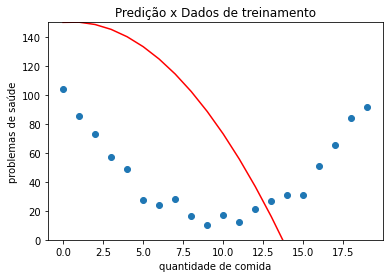

In [24]:
predicoes = f(treino[0], pesos)
plotar_treino_vs_predicoes(treino, predicoes)

Utilizando a mesma função **Loss** já definida acima, podemos chegar ao erro médio dessa solução.

In [25]:
erro = loss(predicoes, treino[1])
print(f"Erro atual: {erro}")

Erro atual: 86.92908477783203


Agora podemos fazer a descida de gradiente utilizando a seguinte fórmula. 

**novo_ponto = ponto_atual - derivada_ponto_atual*taxa_aprendizado**

Então um passo de otimização do erro seria um pequeno incremento com base no ponto atual e na direção da derivada. Esse pequeno incremento deve ser proporcional à taxa de aprendizado, que costuma ser algo entre 0,001 e 0,1, mas pode ser qualquer valor. No meu exemplo vou usar 0.001 para que o passo seja bem pequeno.

In [26]:
erro.backward() #calcula a derivada
taxa_aprendizado = 0.001

pesos.data -= pesos.grad.data * taxa_aprendizado
pesos.grad = None
print(f"a={pesos[0]:.3f}, b={pesos[1]:.3f}, c={pesos[2]:.3f}")

a=-0.812, b=1.002, c=150.000


Se calcularmos novamente o erro, iremos perceber que está um pouco menor. 

In [27]:
erro = loss(predicoes, treino[1])
print(f"Erro atual: {erro}")

Erro atual: 86.92908477783203


E podemos perceber que a solução está um pouco mais próxima dos pontos de treinamento.

<Figure size 432x288 with 0 Axes>

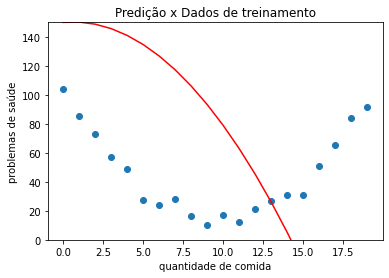

In [28]:
predicoes = f(treino[0], pesos)
plotar_treino_vs_predicoes(treino, predicoes)

Então, para finalizar, podemos colocar tudo isso dentro de uma função python para ir executando passos gradativos e verificando a otimização do modelo.

In [29]:
passos_treinamento = []

def step(treino, pesos, gravar_passo=False, geradorGIF=None):
    predicoes = f(treino[0], pesos)
    theloss = loss(predicoes, treino[1])
    theloss.backward()
    if gravar_passo:
        plotar_treino_vs_predicoes(treino, predicoes, geradorGIF)
        passos_treinamento.append(torch.clone(pesos.data))
    pesos.data -= pesos.grad.data*0.001
    pesos.grad = None
    return pesos

E finalmente colocamos os passos dentro de um loop para que seja executado diversas vezes.

In [30]:
geradorGIF = GeradorGIF("./", "aprendizado")

plt.rcParams.update({'figure.max_open_warning': 0})
for i in range(20000):
    gravar_passo = (((i % 500)==0) or (i<10))
    pesos = step(treino, pesos , gravar_passo, geradorGIF)
        
geradorGIF.finish()

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

Como resultado podemos ver a medida que o aprendizado evolui, a predição do nosso modelo está mais próxima dos dados de treinamento.

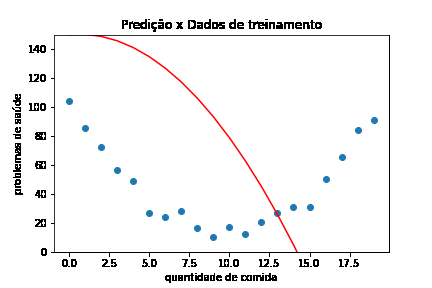

In [31]:
geradorGIF.show((500,500))

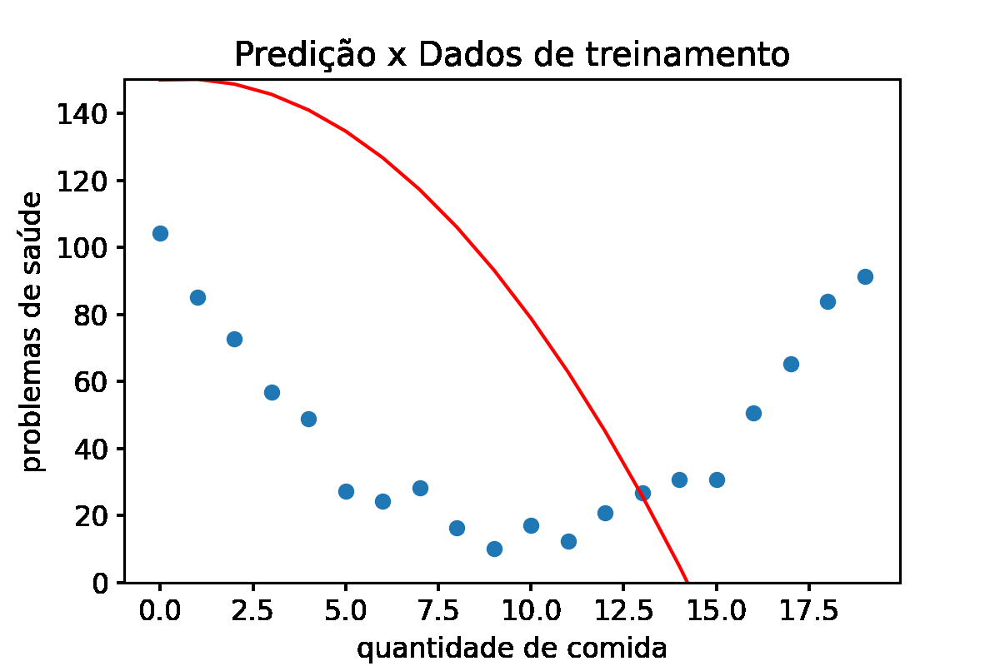

In [32]:
Image(filename="../input/recursos-para-artigo-de-gradiente-descendente/aprendizado.gif", width= 500, height=500)

Como foi explicado antes, para a maioria dos problemas reais, é impraticável calcular toda a curva de **loss** em função dos parâmetros possíveis. Mas apenas para fins didáticos iremos fazer isso aqui.

Note que os parâmetros possíveis são três (**a**, **b** e **c**), além do próprio valor de loss. Dessa forma temos um espaço de quatro dimensões, de modo que um gráfico que o represente também não é praticável. 

Sendo assim, mostraremos o espaço de quatro dimensões (a, b, c, loss) a partir de dois gráficos tridimensionais (a, b, loss) e (a, c, loss). Esses gráficos são a "montanha" a ser descida. 

In [33]:
def gerar_amostra(centro, itens, dispersao):
    return np.linspace(centro-dispersao/2.0,centro+dispersao/2.0,itens,endpoint=True)

#gerando uma amostra dos possíveis pesos durante a otimização
a = gerar_amostra(1.2256, 40, 4)
b = gerar_amostra(-26.0045, 40, 40)
c = gerar_amostra(141.5775, 40, 7)

#esse o valor máxio de loss que colocaremos no gráfico, para evitar que ele fique muito grande
maxloss= 150

#definindo uma função que encontra o erro a partir dos parametros (pesos)
def lossparam(params):
    previsao = f(treino[0], params)
    return loss(previsao, treino[1])

#calculando todos os valoers de loss para o espaço de possibilidades de a e b com c fixo
pontos = []
for ax in a:
    for bx in b:
        l = lossparam(tensor([ax,bx,141.5775]))
        if l<maxloss:
            pontos.append([ax,bx,l])

gradiente_ab = tensor(pontos)
gradiente_ab.shape   

#calculando todos os valores de loss para o espaço de possibilidades de a e c com b fixo
pontos = []
for ax in a:
    for cx in c:
        l = lossparam(tensor([ax, -26.0045, cx]))
        if l<maxloss:
            pontos.append([ax,cx,l])
            
gradiente_ac = tensor(pontos)
gradiente_ac.shape  

torch.Size([920, 3])

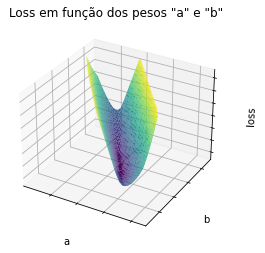

In [34]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.set_title('Loss em função dos pesos "a" e "b"')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
plt.xlabel("a")
plt.ylabel("b")
ax.set_zlabel("loss    ")
ax.plot_trisurf(gradiente_ab[:,0], gradiente_ab[:,1], gradiente_ab[:,2],
                cmap='viridis', edgecolor='none');

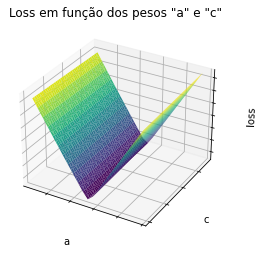

In [35]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.set_title('Loss em função dos pesos "a" e "c"')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
plt.xlabel("a")
plt.ylabel("c")
ax.set_zlabel("loss    ")
ax.plot_trisurf(gradiente_ac[:,0], gradiente_ac[:,1], gradiente_ac[:,2],
                cmap='viridis', edgecolor='none');

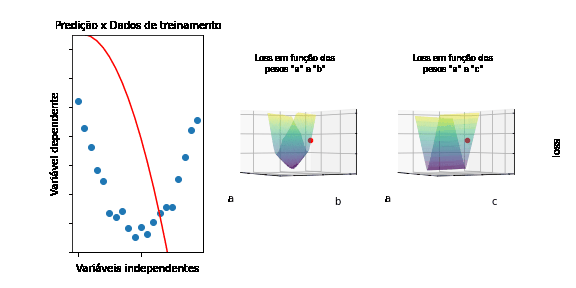

In [36]:
geradorGIF = GeradorGIF("./", "aprendizado_completo")

hist = passos_treinamento
for i in range(len(hist)):
    fig = plt.figure(figsize=plt.figaspect(0.5))
    
    #modelo
    ax = fig.add_subplot(1, 3, 1)
    ax.set_title('Predição x Dados de treinamento', fontsize=10)
    ax.scatter(treino[0], treino[1])
    ax.plot(treino[0], f(treino[0], hist[i]).detach().numpy(), color='red')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_ylim(0,150)
    plt.ylabel("Variável dependente")
    t = plt.xlabel("Variáveis independentes")
        
    #gradiente a, b
    ax = fig.add_subplot(1, 3, 2, projection='3d')  
    ax.set_title('Loss em função dos\npesos "a" e "b"', fontsize=8)
    ax.plot_trisurf(gradiente_ab[:,0], gradiente_ab[:,1], gradiente_ab[:,2],
                    cmap='viridis', edgecolor='none', alpha = 0.5);
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    plt.xlabel("a")
    plt.ylabel("b")
    ax.set_zlabel("loss    ")
    ax.view_init(0, -30)
    ax.scatter(float(hist[i][0]), float(hist[i][1]), lossparam(hist[i]), color='red')
    
    #gradiente a, c
    ax = fig.add_subplot(1, 3, 3, projection='3d') 
    ax.set_title('Loss em função dos\npesos "a" e "c"', fontsize=8)
    ax.plot_trisurf(gradiente_ac[:,0], gradiente_ac[:,1], gradiente_ac[:,2],
                    cmap='viridis', edgecolor='none', alpha = 0.5);
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    plt.xlabel("a")
    plt.ylabel("c")
    ax.set_zlabel("loss    ")
    ax.view_init(0, -30)
    ax.scatter(float(hist[i][0]), float(hist[i][2]), lossparam(hist[i]), color='red')
    
    geradorGIF.add(fig)
    plt.close()
    
geradorGIF.finish()

geradorGIF.show()

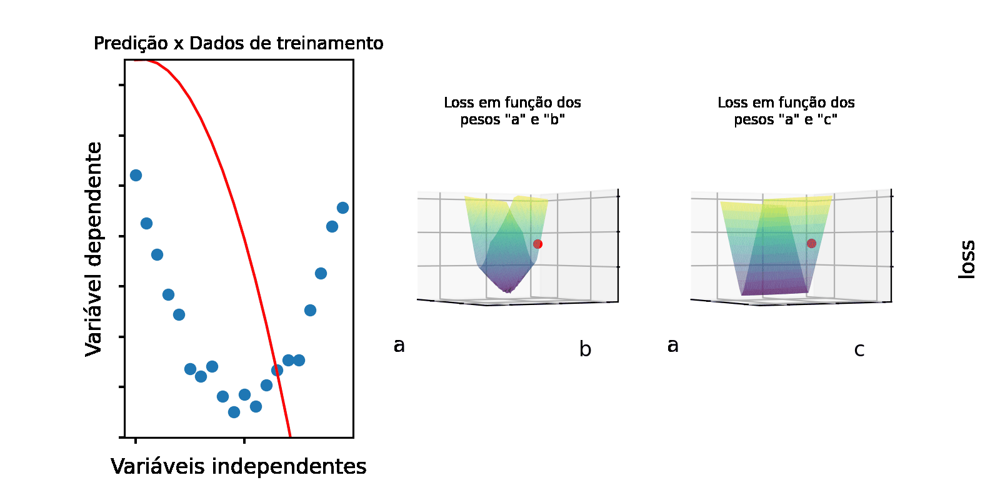

In [37]:
Image(filename="../input/recursos-para-artigo-de-gradiente-descendente/aprendizado_completo.gif")